# Setup Paths

In [2]:
import sys
import os

target_folder_name = "SymbolicDensityEstimation"
# 1. Get the current directory of the notebook.
current_dir = os.getcwd()

# # 2. Join it with '..' to get the parent directory.
parent_dir = os.path.join(current_dir, '..')

# # 3. change directory
current_folder_name = os.path.basename(current_dir)
is_match = current_folder_name == target_folder_name
if not is_match:
    os.chdir(parent_dir)

# # Get the current working directory as a string
current_directory = os.getcwd()

print("The current working directory is:")
print(current_directory)

The current working directory is:
/home/angel/WIP/Research/SymbolicDensityEstimation


# Imports

In [3]:
%load_ext autoreload
%autoreload 2
%reload_ext autoreload

import numpy as np
from sklearn.neighbors import KernelDensity
import scipy
from scipy.stats import gaussian_kde
import pandas as pd
from tqdm import tqdm
from config_management.data_config_2d_gaussian_cluster_1 import DataConfig
from matplotlib import pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # Needed for 3D plotting
from matplotlib import cm  # For colormap
from KDEpy import FFTKDE
from scipy.stats import multivariate_normal
from scipy.interpolate import RegularGridInterpolator
import sympy as sp
from sympy.parsing.sympy_parser import parse_expr
import gc
import dill

# Data Exploration

In [4]:
file_path = './data/two_modal_samples_cluster_1.csv'
df = pd.read_csv(file_path)
print(df.head())
columns = ['x1', 'x2']
samples = df[columns].to_numpy()
# Extract m13^2 and m23^2 columns
x1 = df["x1"]
x2 = df["x2"]

         x1        x2
0  2.920079 -4.949610
1  4.780361 -3.668562
2  4.863319 -4.845659
3  3.905819 -3.654808
4  3.772758 -5.224335


## Scatter Plot

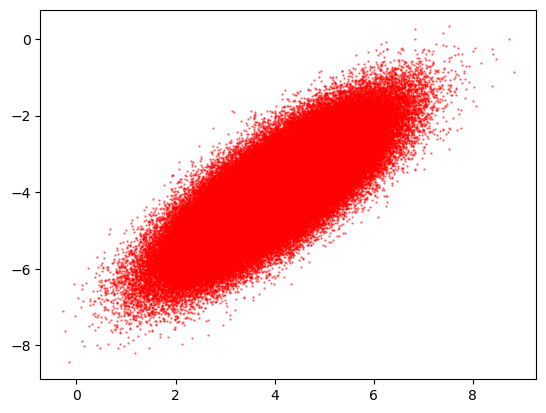

2856

In [5]:
plt.scatter(x1, x2, s=0.5, alpha=0.5, label='Data Points', color='red')
plt.show()
plt.close() 
gc.collect()

In [6]:
if DataConfig.slices is None:
    xmin, xmax = x1.min()-DataConfig.grid_tolerance, x1.max()+DataConfig.grid_tolerance
    ymin, ymax = x2.min()-DataConfig.grid_tolerance, x2.max()+DataConfig.grid_tolerance
    grids = np.mgrid[xmin:xmax:DataConfig.jxbins, ymin:ymax:DataConfig.jxbins]
else:
    slices = DataConfig.slices
    grids = np.mgrid[tuple(slices)]

grid_coordinates = np.vstack([grids[0].ravel(), grids[1].ravel()])
grid_coordinates = grid_coordinates.T

In [7]:
with open(f"models/gaussian_cluster_1_kde_wrapped.pkl", "rb") as f:
    wrapper_model = dill.load(f)
kde_predicted_density = wrapper_model.evaluate(grid_coordinates).reshape(grids[0].shape)

## Ground Truth Defintion

In [8]:
pow2 = lambda x: x ** 2
pow3 = lambda x: x ** 3
pow4 = lambda x: x ** 4
pow5 = lambda x: x ** 5

def ground_truth_cluster_2(x1, x2):
    # Mean and covariance
    mu = [-4, 4]
    sigma = [[1, 0.8], [0.8, 1]]
    
    # Stack grid into a (..., 2) shape expected by multivariate_normal
    pos = np.stack([x1, x2], axis=-1)
    
    # Evaluate the PDF
    rv = multivariate_normal(mean=mu, cov=sigma)
    return rv.pdf(pos)

def ground_truth_cluster_1(x1, x2):
    # Mean and covariance
    mu = [4, -4]
    sigma = [[1, 0.8], [0.8, 1]]
    
    # Stack grid into a (..., 2) shape expected by multivariate_normal
    pos = np.stack([x1, x2], axis=-1)
    
    # Evaluate the PDF
    rv = multivariate_normal(mean=mu, cov=sigma)
    return rv.pdf(pos)

ground_truth_density = ground_truth_cluster_1(grids[0], grids[1])

## KDE Heatmap

In [9]:
xlim = (-4, 12)
ylim = (-12, 4)
color_level_min, color_level_max = 0.0, 0.15

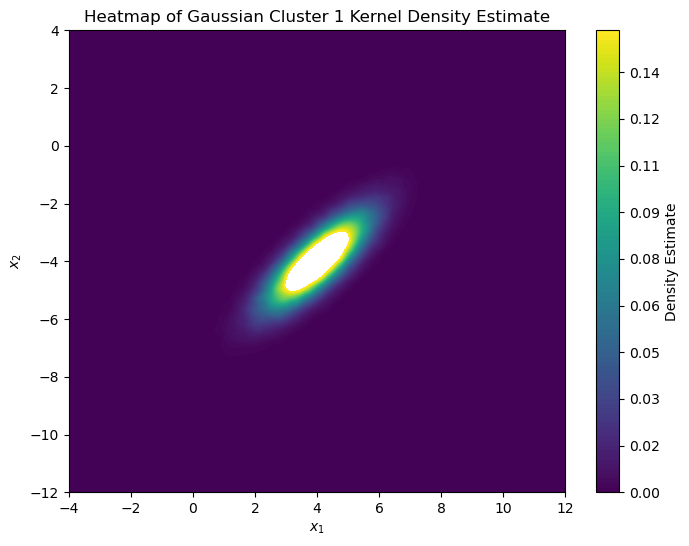

In [10]:
levels = np.linspace(color_level_min, color_level_max, 100)  # for 30 intervals

plt.figure(figsize=(8, 6))
cf = plt.contourf(
    grids[0],
    grids[1],
    kde_predicted_density,
    levels=levels,
    cmap="viridis"
)
cbar = plt.colorbar(cf, format="%.2f")
cbar.set_label("Density Estimate")
plt.xlabel(r"$x_1$")
plt.ylabel(r"$x_2$")
plt.xlim(xlim)
plt.ylim(ylim)
plt.title("Heatmap of Gaussian Cluster 1 Kernel Density Estimate")
plt.show()

## Residual of KDE and Ground Truth

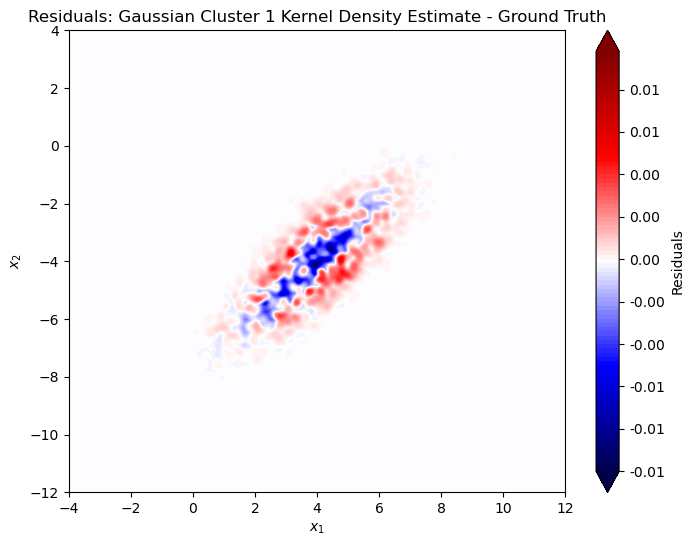

In [11]:
res_color_level_min, res_color_level_max = -0.01, 0.01
levels = np.linspace(res_color_level_min, res_color_level_max, 100)  # for 100 intervals

plt.figure(figsize=(8, 6))
cf = plt.contourf(
    grids[0],
    grids[1],
    kde_predicted_density - ground_truth_density,
    levels=levels,
    cmap="seismic",
    extend="both"
)
cbar = plt.colorbar(cf, format="%.2f")
cbar.set_label("Residuals")
plt.xlabel(r"$x_1$")
plt.ylabel(r"$x_2$")
plt.title("Residuals: Gaussian Cluster 1 Kernel Density Estimate - Ground Truth")
plt.xlim(xlim)
plt.ylim(ylim)
plt.show()

In [12]:
density_scale_factor = np.loadtxt("data/processed_data/gaussian_cluster_1_scale_factor.txt")
print(f"scale factor: {density_scale_factor}")
print(f"max kde density: {np.max(kde_predicted_density)}, min kde density: {np.min(kde_predicted_density)}")
print(f"max ground truth density: {np.max(ground_truth_density)}, min ground truth density: {np.min(ground_truth_density)}")
kde_predicted_density_scaled = kde_predicted_density * density_scale_factor
ground_truth_density_scaled = ground_truth_density * density_scale_factor
print(f"max scaled kde density: {np.max(kde_predicted_density_scaled)}, min scaled kde density: {np.min(kde_predicted_density_scaled)}")
print(f"max scaled ground truth density: {np.max(ground_truth_density_scaled)}, min scaled ground truth density: {np.min(ground_truth_density_scaled)}")

data_in_pipeline = np.loadtxt('data/processed_data/gaussian_cluster_1_joint_data_in_pipeline.csv', delimiter=',', skiprows=1)
print(f"max data in pipeline: {np.max(data_in_pipeline[:,2])}, min data in pipeline: {np.min(data_in_pipeline[:,2])}")


scale factor: 38.806484837911526
max kde density: 0.25768888993085576, min kde density: 1.812298215780434e-16
max ground truth density: 0.26519900298595955, min ground truth density: 2.814716585799971e-140
max scaled kde density: 10.000000000000005, min scaled kde density: 7.032892323245752e-15
max scaled ground truth density: 10.291441088403893, min scaled ground truth density: 1.0922925650986467e-138
max data in pipeline: 10.000000000000005, min data in pipeline: 7.032892323245752e-15


# Results

In [13]:
pow2 = lambda x: x ** 2
pow3 = lambda x: x ** 3
pow4 = lambda x: x ** 4
pow5 = lambda x: x ** 5

In [14]:
file_path = "data/pareto_results/gaussian_cluster_1_results.py"
exec(open(file_path).read())

Original at complexity 1: 0.1508056412090513
function_ready: 0.1508056412090513
Processed: 0.150000000000000
LaTeX: 0.15

Original at complexity 2: pow2(0.38836825607381914)
function_ready: pow2(0.38836825607381914)
Processed: pow2(0.39)
LaTeX: 0.15

Original at complexity 6: x1 / (pow2(x1) - -6.560340036952618)
function_ready: x1 / (pow2(x1) - -6.560340036952618)
Processed: x1/(pow2(x1) + 6.6)
LaTeX: \frac{x_{1}}{x_{1}^{2} + 6.6}

Original at complexity 7: 1.111574265622513 / exp(pow2(-4.0040949112577 - x2))
function_ready: 1.111574265622513 / np.exp(pow2(-4.0040949112577 - x2))
Processed: 1.1*exp(-pow2(-x2 - 4.0))
LaTeX: 1.1 e^{- 16.0 \left(- 0.25 x_{2} - 1\right)^{2}}

Original at complexity 8: 1.0474322867635042 / (1.0474322867635042 + pow2(3.994484544828738 + x2))
function_ready: 1.0474322867635042 / (1.0474322867635042 + pow2(3.994484544828738 + x2))
Processed: 1.0/(pow2(x2 + 4.0) + 1.0)
LaTeX: \frac{1.0}{16.0 \left(0.25 x_{2} + 1\right)^{2} + 1.0}

Original at complexity 9: 1.45

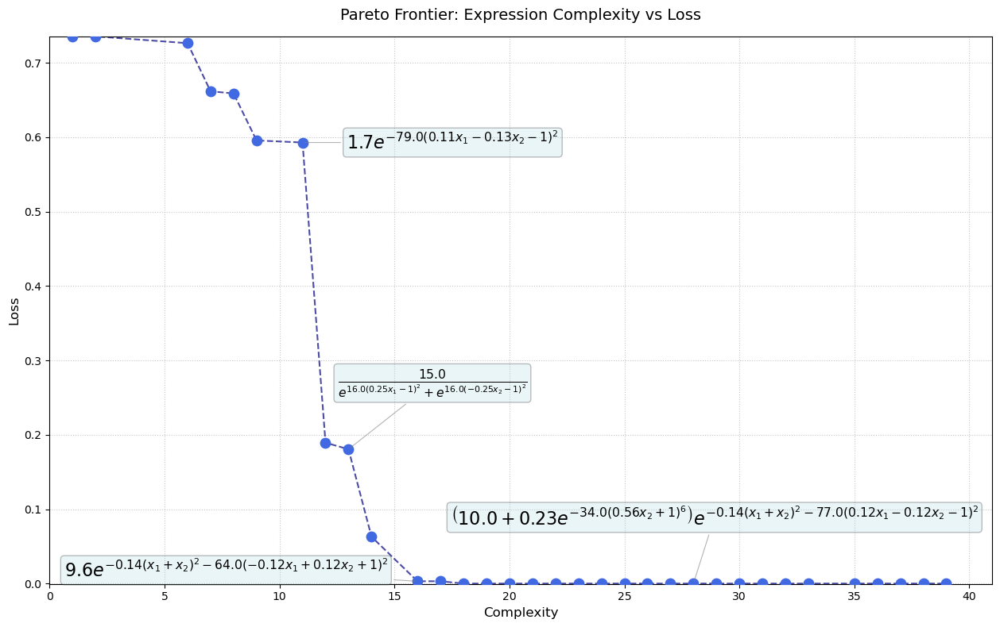

In [25]:
range_of_interest = (1, 48)
indices_of_interest = [i for i, c in enumerate(complexity) if range_of_interest[0] <= c <= range_of_interest[1]]
complexity = [complexity[i] for i in indices_of_interest]
loss = [loss[i] for i in indices_of_interest]
raw_equations = [raw_equations[i] for i in indices_of_interest]

# 2) Sympy setup
x1, x2 = sp.symbols('x1 x2')

# 3) Custom function to round constants only (not function arguments)
def round_constants(expr, ndigits=1):
    """
    Round every bare Float in `expr` so that, when printed,
    it has exactly `ndigits` digits after the decimal point
    in scientific notation (i.e. nd+1 significant figures).
    """
    def _is_leaf_float(e):
        return e.is_Float and not e.args

    def _round_sci(e):
        f = float(e)
        # format with `ndigits` places after the decimal in the mantissa:
        sci_str = f"{f:.{ndigits}e}"
        return sp.Float(sci_str)

    return expr.replace(_is_leaf_float, _round_sci)

# 4) Function to convert pow2 to squared form without evaluation
def convert_pow2(expr):
    # Find all pow2 calls
    if expr.func.__name__ == 'pow2':
        return sp.Pow(convert_pow2(expr.args[0]), 2, evaluate=False)
    # Recurse through expression
    return expr.func(*[convert_pow2(arg) for arg in expr.args]) if expr.args else expr

def convert_pow3(expr):
    # Find all pow3 calls
    if expr.func.__name__ == 'pow3':
        return sp.Pow(convert_pow3(expr.args[0]), 3, evaluate=False)
    # Recurse through expression
    return expr.func(*[convert_pow3(arg) for arg in expr.args]) if expr.args else expr

def convert_pow4(expr):
    # Find all pow4 calls
    if expr.func.__name__ == 'pow4':
        return sp.Pow(convert_pow4(expr.args[0]), 4, evaluate=False)
    # Recurse through expression
    return expr.func(*[convert_pow4(arg) for arg in expr.args]) if expr.args else expr

def convert_pow5(expr):
    # Find all pow5 calls
    if expr.func.__name__ == 'pow5':
        return sp.Pow(convert_pow5(expr.args[0]), 5, evaluate=False)
    # Recurse through expression
    return expr.func(*[convert_pow5(arg) for arg in expr.args]) if expr.args else expr

# 4) Function to convert pow_int without evaluation
def convert_pow_int(expr):
    # Find all pow_int calls
    if expr.func.__name__ == 'pow_int':
        base, exp = expr.args
        # If exp is literally an integer, convert to a Python int
        if exp.is_integer and exp.is_number:
            exp = int(exp)
        # Otherwise leave exp symbolic
        return sp.Pow(convert_pow_int(base), convert_pow_int(exp), evaluate=False)

    # Recursively descend into all other function applications
    if expr.args:
        return expr.func(*[convert_pow_int(arg) for arg in expr.args])
    else:
        return expr
    
def replace_pow_functions_recursive(expr: sp.Expr) -> sp.Expr:
    """
    Recursively replaces custom functions like powN(x) with standard power notation x**N.
    E.g. pow3(x + pow2(y)) → (x + y**2)**3
    """
    # First, apply recursively to all arguments (bottom-up),
    # so that nested pow-functions inside arguments get replaced too.
    expr = expr.xreplace({})  # no-op; just ensures expr is a Basic (not strictly needed)

    # Define replacement function
    def _repl(f):
        # check it's a function call
        if not isinstance(f, sp.Function):
            return f

        name = f.func.__name__
        if not name.startswith("pow"):
            return f

        # parse N from “powN”
        try:
            N = int(name[len("pow"):])
        except ValueError:
            return f

        if len(f.args) != 1:
            # unexpected arity, leave unchanged
            return f

        base = f.args[0]
        # Recursively transform the base
        new_base = replace_pow_functions_recursive(base)
        return new_base ** N

    # Use replace with map=False (so it returns an Expr)
    new_expr = expr.replace(
        lambda x: isinstance(x, sp.Function) and x.func.__name__.startswith("pow"),
        _repl,
        map=False
    )
    return new_expr

# 5) Build MathText labels
latex_labels = []
exprs_final = []
function_ready = []
for id, s in enumerate(raw_equations):
    try:
        # Pre-process pow2 -> custom function
        s_processed = s.replace('pow2', 'pow2_func')
        s_processed = s.replace('pow3', 'pow3_func')
        s_processed = s.replace('pow4', 'pow4_func')
        s_processed = s.replace('pow5', 'pow5_func')
        s_processed = s_processed.replace('pow_int', 'pow_int_func')
        
        # Define custom functions
        locals_dict = {
            'x1': x1,
            'x2': x2,
            'pow2_func': sp.Function('pow2'),
            'pow3_func': sp.Function('pow3'),
            'pow4_func': sp.Function('pow4'),
            'pow5_func': sp.Function('pow5'),
            'pow_int_func': sp.Function('pow_int'),
            'asin': sp.asin,
            'atan': sp.atan,
            'tan': sp.tan,
            'exp': sp.exp,
        }
        
        # Parse while preserving structure
        expr = parse_expr(s_processed, evaluate=False, local_dict=locals_dict)
        
        # Convert pow2_func to squared form
        expr_converted_pow2 = convert_pow2(expr)
        expr_converted_pow3 = convert_pow3(expr)
        expr_converted_pow4 = convert_pow4(expr)
        expr_converted_pow5 = convert_pow5(expr)
        expr_converted = convert_pow_int(expr_converted_pow5)
        
        # Round constants (only standalone floats)
        expr_converted_int1 = round_constants(expr_converted)
        expr_converted_int2 = round_constants(expr_converted_int1)
        expr_final = round_constants(expr_converted_int2)
        # expr_final = expr_final.simplify()
        # expr_final = expr_final.expand()
        exprs_final.append(expr_final)

        # Get MathText-friendly LaTeX
        mt = replace_pow_functions_recursive(expr_final)
        expr_converted_int1 = round_constants(mt)
        expr_converted_int2 = round_constants(expr_converted_int1)
        mt = round_constants(expr_converted_int2)
        mt = sp.latex(mt)
        latex_labels.append(f"${mt}$")
        
        # Replace 'exp' with 'np.exp'
        modified_expression = s.replace('exp', 'np.exp')
    
        # Replace 'log' with 'np.log'
        modified_expression = modified_expression.replace('log', 'np.log')
        function_ready.append(modified_expression)
        # Debug print
        print(f"Original at complexity {complexity[id]}: {s}")
        print(f"function_ready: {modified_expression}")
        print(f"Processed: {expr_final}")
        print(f"LaTeX: {mt}\n")
    except Exception as e:
        print(f"Error processing expression: {s}\n{e}")
        latex_labels.append(f"Error: {s}")

# 6) Manual offsets for clarity
offsets = [
    (0, 0), (0, 0), (0, 0), (0, 0), (0, 0),
    (0, 0), (40, 0), (0, 0), (-10, 60), (0, 0),
    (-320, 10), (0, 0), (0, 0), (0, 0), (0, 0),
    (0, 0), (0, 0), (0, 0), (0, 0), (0, 0),
    (0, 0), (0, 0), (-220, 60), (0, 0), (0, 0),
]

# 7) Plot
fig, ax = plt.subplots(figsize=(14, 8))
ax.scatter(complexity, loss, s=80, zorder=3, color='royalblue')
ax.plot(complexity, loss, linestyle='--', alpha=0.7, zorder=2, color='navy')

# Set axis limits
ax.set_xlim(min(complexity) - 1, max(complexity) + 2)
ax.set_ylim(min(loss) - 0.0005, max(loss))
fig.subplots_adjust(right=0.75)


skip_indices = []
keep_indices = [7-1, 9-1, 11-1, 23-1]
# Annotate with MathText labels
for i, (x, y, lbl, (dx, dy)) in enumerate(zip(complexity, loss, latex_labels, offsets)):
    if i in skip_indices or (i not in keep_indices):
        continue
    ax.annotate(
        lbl,
        xy=(x, y),
        xytext=(dx, dy),
        textcoords='offset points',
        ha='left',
        va='center',
        fontsize=16,
        bbox=dict(boxstyle='round,pad=0.2', alpha=0.25, fc='lightblue'),
        arrowprops=dict(arrowstyle='-', lw=0.8, alpha=0.6, color='gray')
    )

ax.set_title("Pareto Frontier: Expression Complexity vs Loss", fontsize=14, pad=15)
ax.set_xlabel("Complexity", fontsize=12)
ax.set_ylabel("Loss", fontsize=12)
ax.grid(True, linestyle=':', alpha=0.7)
ax.tick_params(axis='both', which='major', labelsize=10)

plt.tight_layout()
plt.show()

# Residuals: Prediction - Ground Truth

In [59]:
level_min = 0
level_max = 0.3
level_min_delta = -0.02
level_max_delta = 0.02

In [60]:
predicted_functions = [eval(f'lambda x1, x2: {str_func}', {'np':np, 'pow2':pow2, 'pow3':pow3, 'pow4':pow4, 'pow5':pow5}) for str_func in function_ready]

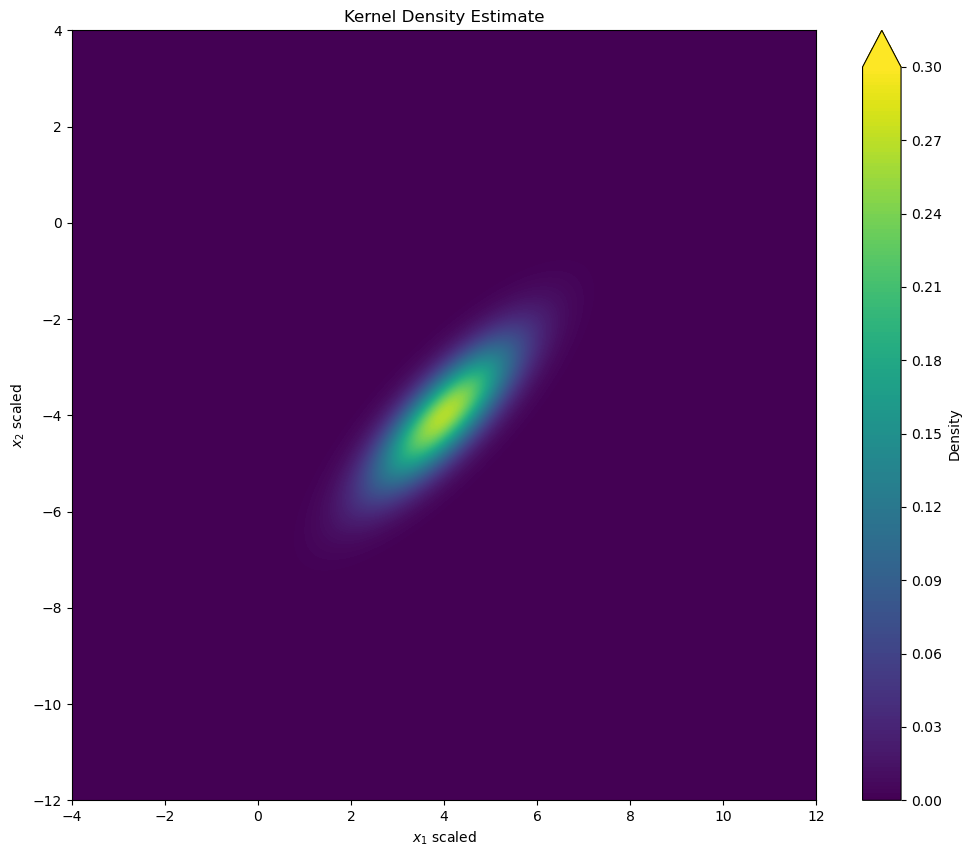

In [61]:
# 4. Plot the result
plt.figure(figsize=(12, 10))
plt.contourf(grids[0], grids[1], ground_truth_density, levels=np.linspace(level_min, level_max, 200), cmap="viridis", extend='max')
plt.colorbar(label="Density", ticks=np.linspace(level_min, level_max, 11))
plt.xlabel(r"$x_1$ scaled")
plt.ylabel(r"$x_2$ scaled")
plt.title("Kernel Density Estimate") 
plt.show()

In [62]:
# 2. Interpolate the reflected function at the original grid points
# Prepare the interpolator for the original function
interp_kde_at_samples = RegularGridInterpolator(
    (grids[0][:,0], grids[1][0,:]),  # axes of the grid
    ground_truth_density,            # function values
    bounds_error=False,
    fill_value=0
)

# Load the test set for the Gaussian cluster 1
test_samples = np.loadtxt("./data/processed_data/gaussian_cluster_1_test_samples.csv", delimiter=",")

# For each original grid point, get the value of the reflected functions at that location
kde_eval_at_samples = interp_kde_at_samples(test_samples)
likelihood_score = np.sum(np.log(kde_eval_at_samples))
print(f"Likelihood score of the corrected KDE: {likelihood_score:,}")

Likelihood score of the corrected KDE: -58,287.21472001271


In [63]:
print(f"min kde: {np.min(ground_truth_density):.3f}, max kde: {np.max(ground_truth_density):.3f}")

min kde: 0.000, max kde: 0.265


In [64]:
kde_eval_at_samples = interp_kde_at_samples(test_samples)
likelihood_score = np.sum(np.log(kde_eval_at_samples))
print(f"Likelihood score of the corrected KDE: {likelihood_score:,}\n")

for idx, func in enumerate(predicted_functions):
    # Compute likelihood scores
    prediction_eval_at_samples = func(test_samples[:, 0], test_samples[:, 1])
    likelihood_score_pred = np.sum(np.log(prediction_eval_at_samples/density_scale_factor + 1e-12))  # add small value to avoid log(0)
    print(f"Function at complexity {complexity[idx]}: Likelihood score = {likelihood_score_pred:,}")

Likelihood score of the corrected KDE: -58,287.21472001271

Function at complexity 1: Likelihood score = -5.550350782964
Function at complexity 2: Likelihood score = -5.550189919184287
Function at complexity 6: Likelihood score = -135,370.34368510122
Function at complexity 7: Likelihood score = -114,171.90709021433
Function at complexity 8: Likelihood score = -104,636.5901942695
Function at complexity 9: Likelihood score = -92,109.23787515209
Function at complexity 11: Likelihood score = -92,289.71993330917
Function at complexity 12: Likelihood score = -85,266.5611519999
Function at complexity 13: Likelihood score = -69,551.63693134433
Function at complexity 14: Likelihood score = -67,747.17997216046
Function at complexity 16: Likelihood score = -57,483.67007479108
Function at complexity 17: Likelihood score = -57,488.67733995623
Function at complexity 18: Likelihood score = -58,303.35361278922
Function at complexity 19: Likelihood score = -58,296.54618693186
Function at complexity 20:

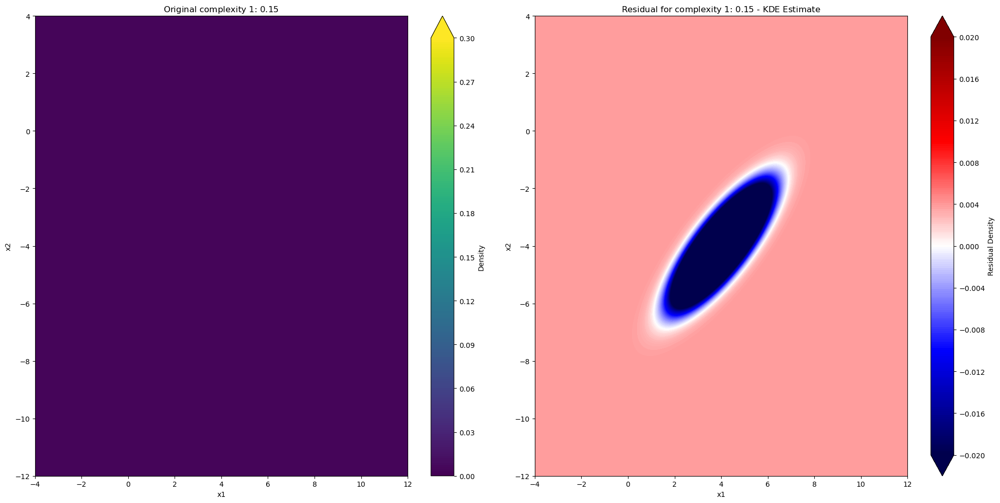

Complexity 1: Likelihood score: -5.550350783221328
complexity 1 :: min predict: 0.00, max predict: 0.00
complexity 1 :: min residual: -0.26, max residual: 0.00
Complexity 1: MSE error: 7.535568e-01


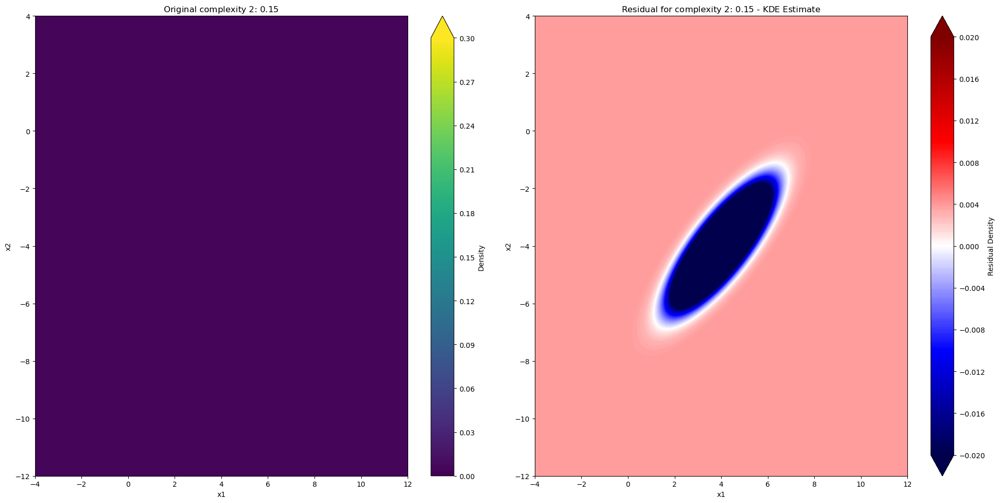

Complexity 2: Likelihood score: -5.550189919441574
complexity 2 :: min predict: 0.00, max predict: 0.00
complexity 2 :: min residual: -0.26, max residual: 0.00
Complexity 2: MSE error: 7.535568e-01


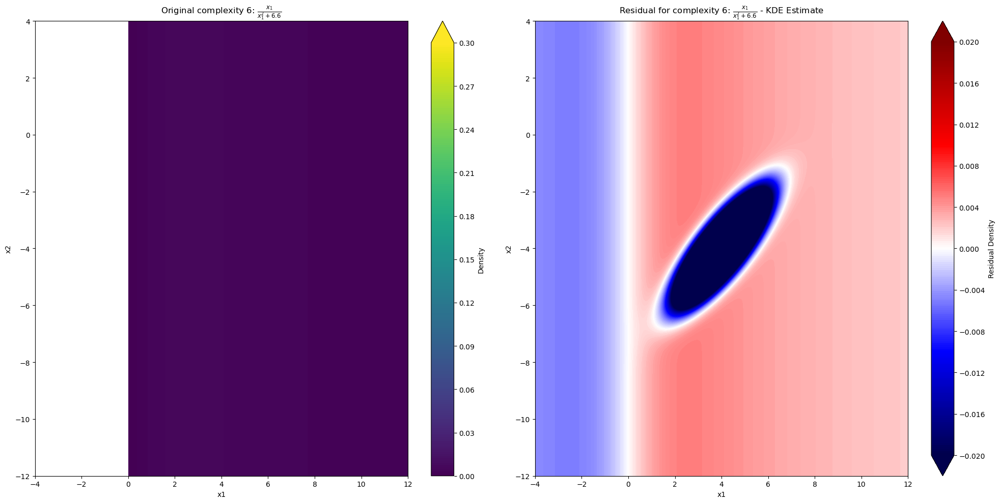

Complexity 6: Likelihood score: -135,370.34369070877
complexity 6 :: min predict: -0.01, max predict: 0.01
complexity 6 :: min residual: -0.26, max residual: 0.01
Complexity 6: MSE error: 7.443807e-01


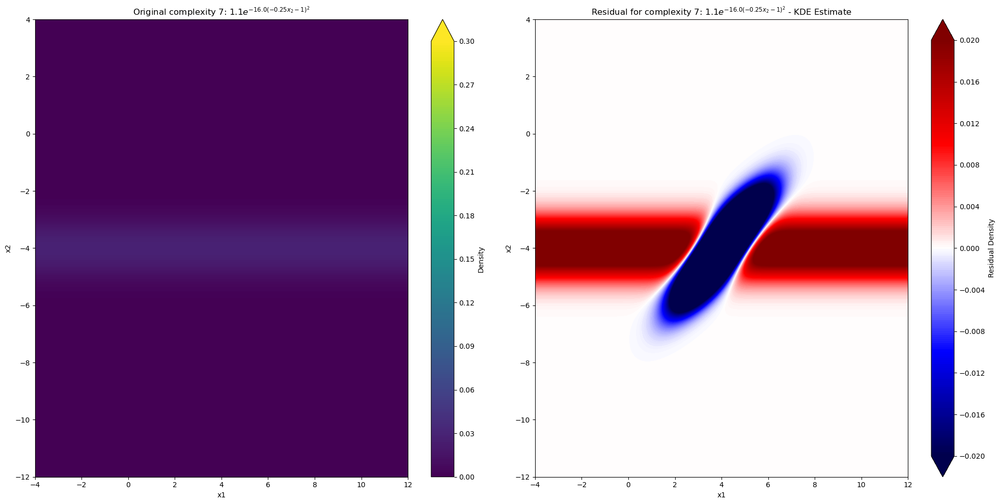

Complexity 7: Likelihood score: -114,171.91012582973
complexity 7 :: min predict: 0.00, max predict: 0.03
complexity 7 :: min residual: -0.24, max residual: 0.03
Complexity 7: MSE error: 6.792561e-01


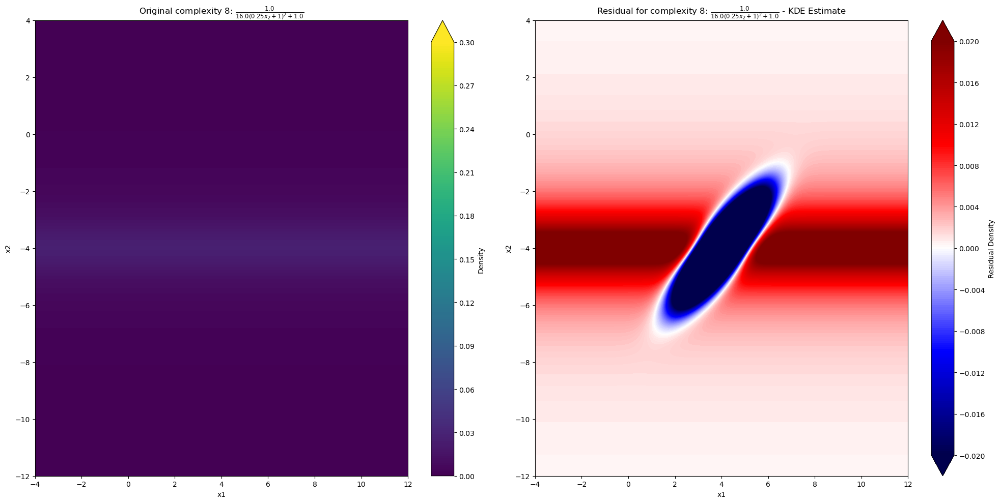

Complexity 8: Likelihood score: -104,636.59019617547
complexity 8 :: min predict: 0.00, max predict: 0.03
complexity 8 :: min residual: -0.24, max residual: 0.03
Complexity 8: MSE error: 6.764822e-01


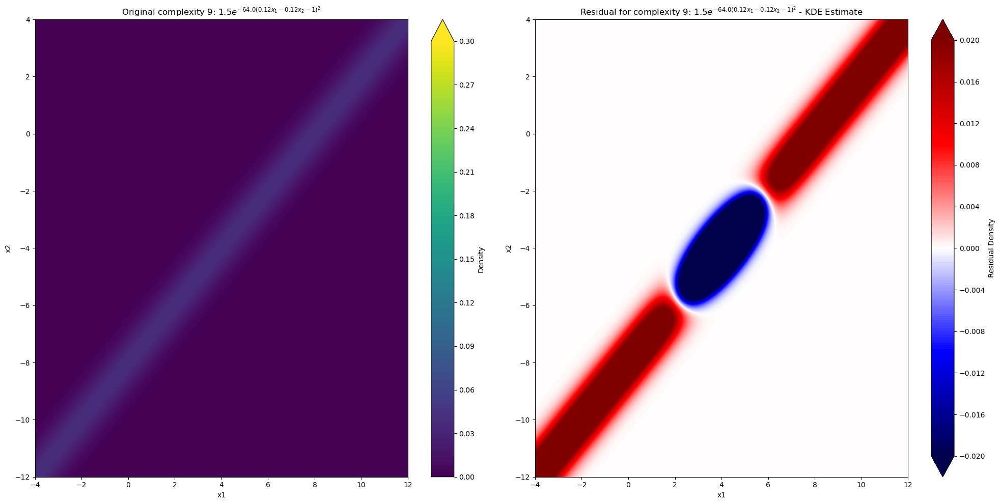

Complexity 9: Likelihood score: -92,109.23787661018
complexity 9 :: min predict: 0.00, max predict: 0.04
complexity 9 :: min residual: -0.23, max residual: 0.04
Complexity 9: MSE error: 6.104503e-01


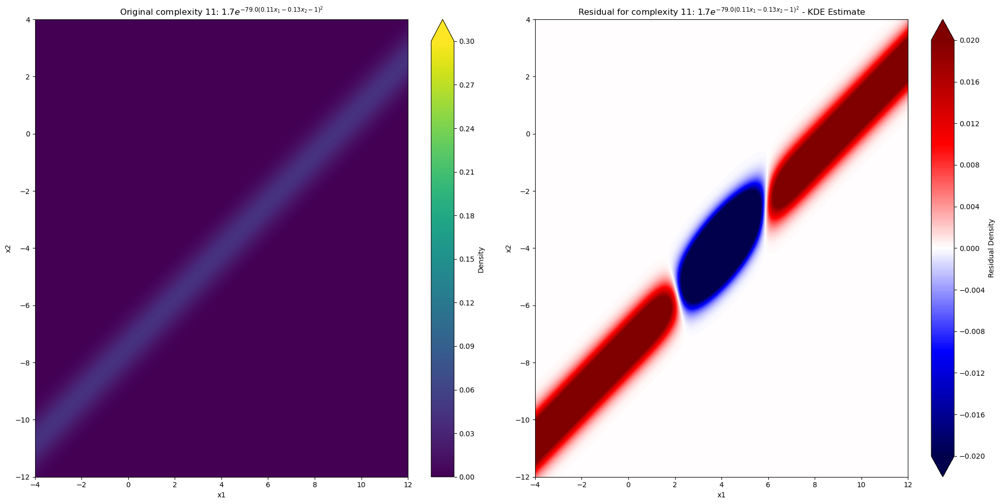

Complexity 11: Likelihood score: -92,289.71993628918
complexity 11 :: min predict: 0.00, max predict: 0.04
complexity 11 :: min residual: -0.22, max residual: 0.04
Complexity 11: MSE error: 6.074298e-01


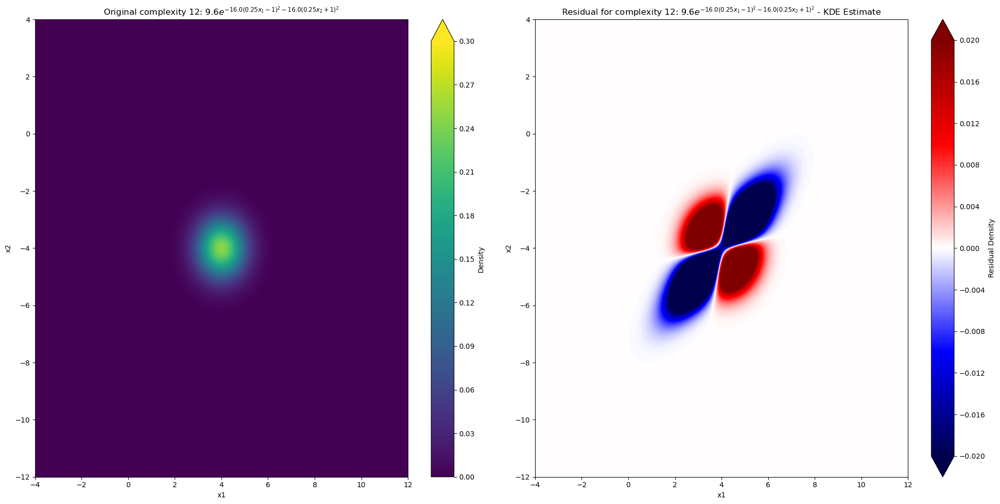

Complexity 12: Likelihood score: -85,272.26247254519
complexity 12 :: min predict: 0.00, max predict: 0.25
complexity 12 :: min residual: -0.12, max residual: 0.08
Complexity 12: MSE error: 1.978088e-01


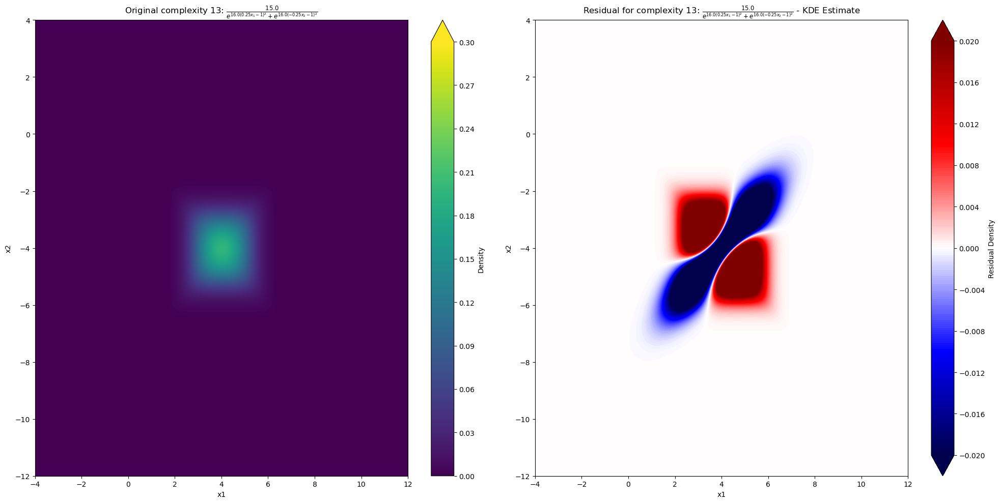

Complexity 13: Likelihood score: -69,551.63730084288
complexity 13 :: min predict: 0.00, max predict: 0.20
complexity 13 :: min residual: -0.08, max residual: 0.10
Complexity 13: MSE error: 1.906652e-01


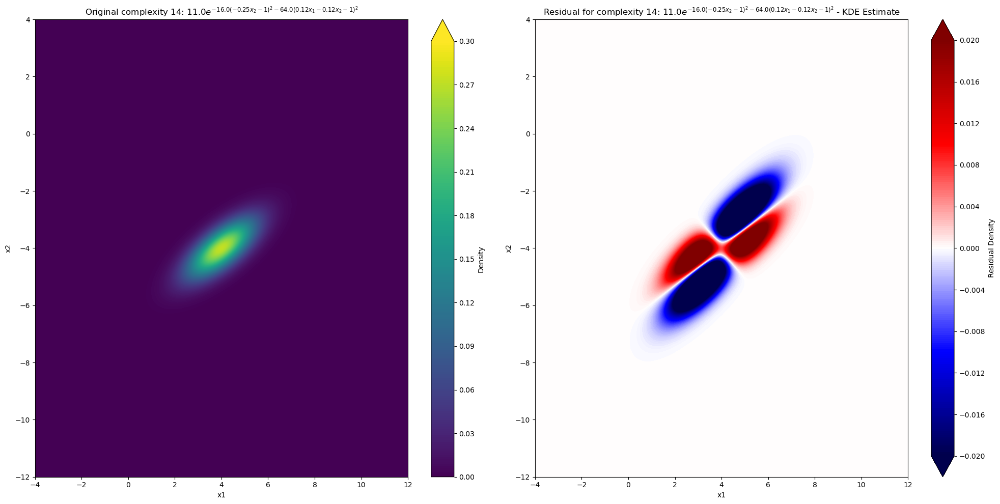

Complexity 14: Likelihood score: -67,747.18373566968
complexity 14 :: min predict: 0.00, max predict: 0.27
complexity 14 :: min residual: -0.07, max residual: 0.04
Complexity 14: MSE error: 6.548585e-02


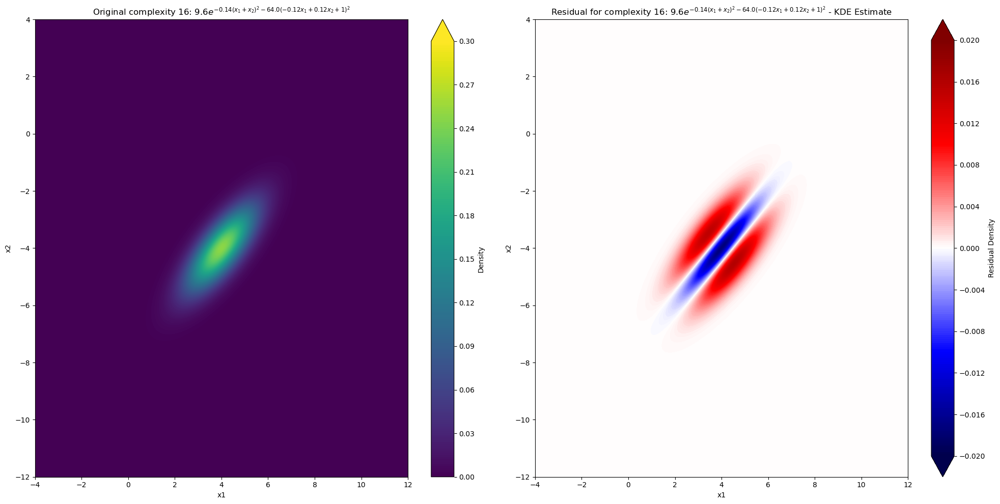

Complexity 16: Likelihood score: -57,483.67007549377
complexity 16 :: min predict: 0.00, max predict: 0.25
complexity 16 :: min residual: -0.02, max residual: 0.02
Complexity 16: MSE error: 4.872850e-03


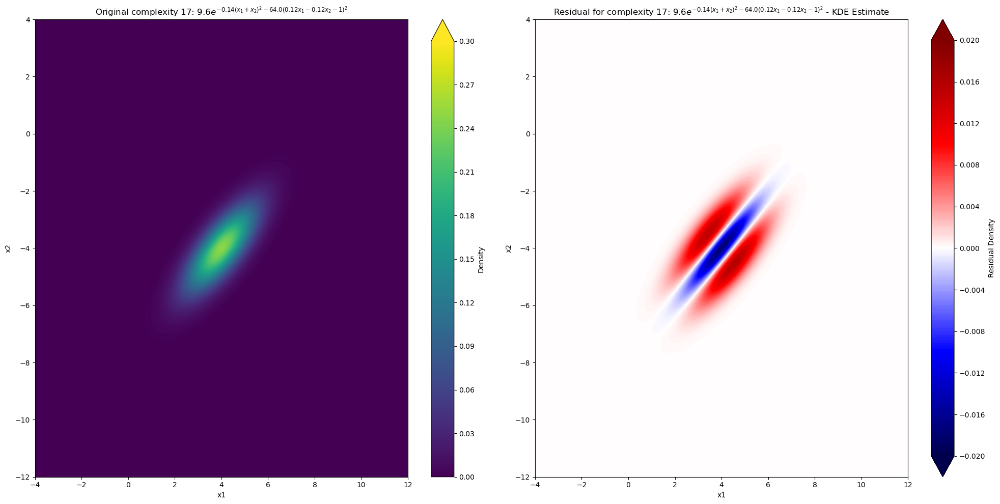

Complexity 17: Likelihood score: -57,488.67734065442
complexity 17 :: min predict: 0.00, max predict: 0.25
complexity 17 :: min residual: -0.02, max residual: 0.02
Complexity 17: MSE error: 4.888546e-03


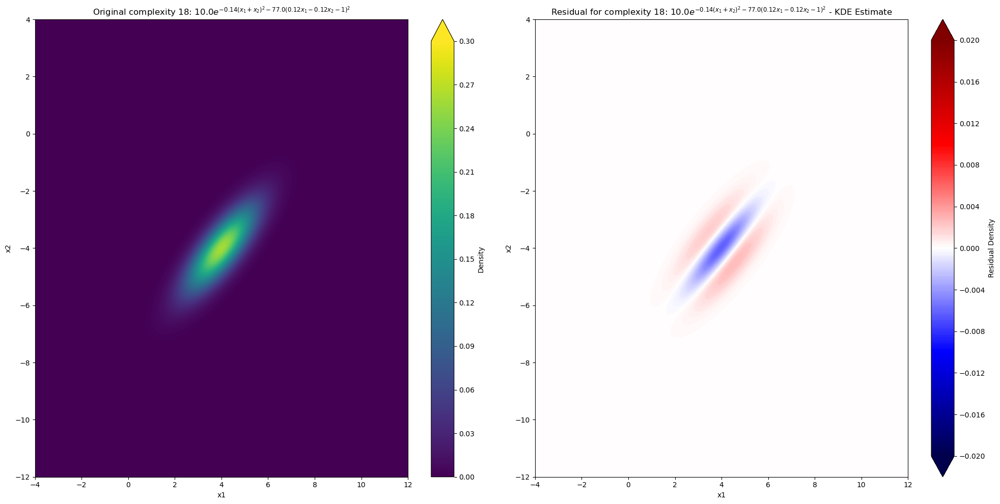

Complexity 18: Likelihood score: -58,303.35361374769
complexity 18 :: min predict: 0.00, max predict: 0.26
complexity 18 :: min residual: -0.01, max residual: 0.00
Complexity 18: MSE error: 2.949701e-04


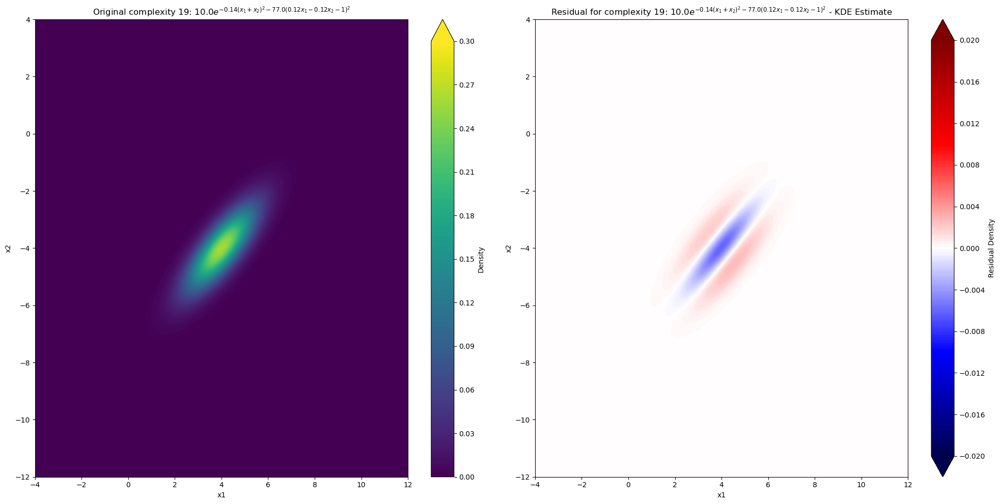

Complexity 19: Likelihood score: -58,296.54618789307
complexity 19 :: min predict: 0.00, max predict: 0.26
complexity 19 :: min residual: -0.01, max residual: 0.00
Complexity 19: MSE error: 2.785551e-04


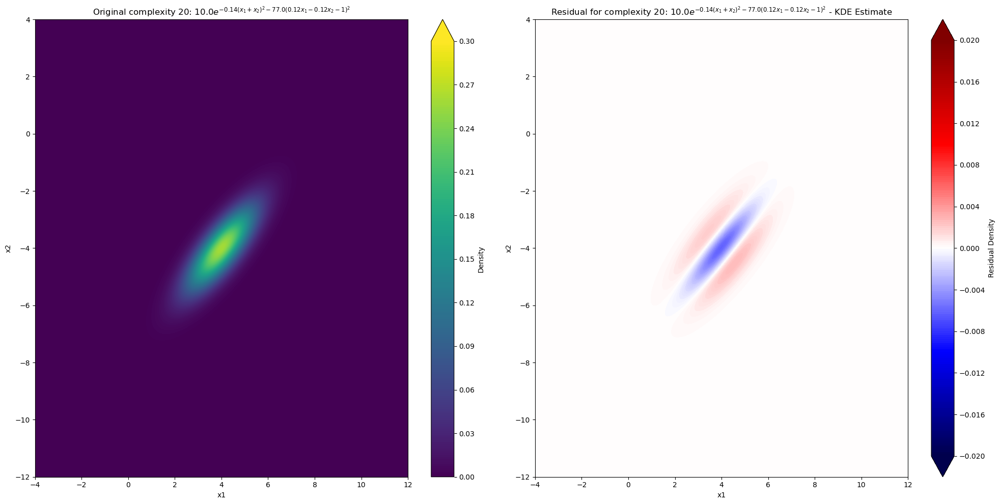

Complexity 20: Likelihood score: -58,305.110061546664
complexity 20 :: min predict: 0.00, max predict: 0.26
complexity 20 :: min residual: -0.01, max residual: 0.00
Complexity 20: MSE error: 2.845781e-04


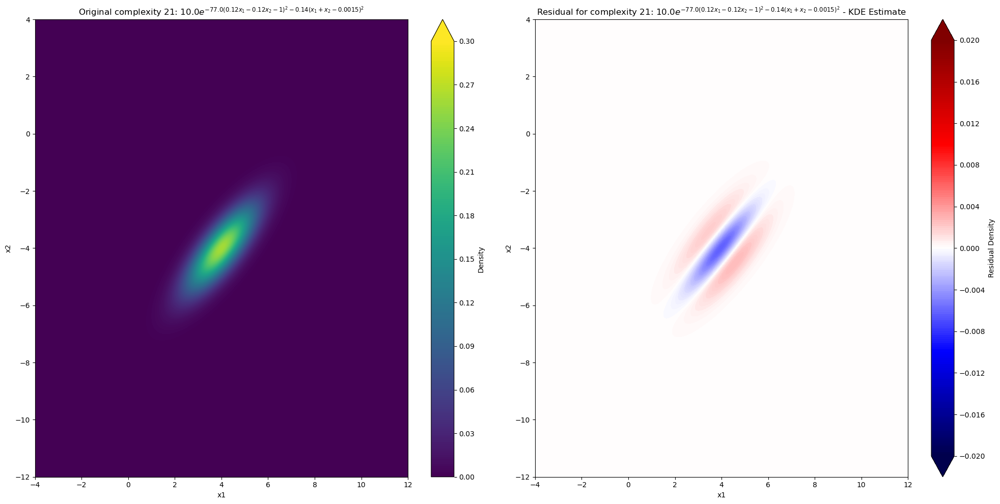

Complexity 21: Likelihood score: -58,312.5779669299
complexity 21 :: min predict: 0.00, max predict: 0.26
complexity 21 :: min residual: -0.01, max residual: 0.00
Complexity 21: MSE error: 2.963889e-04


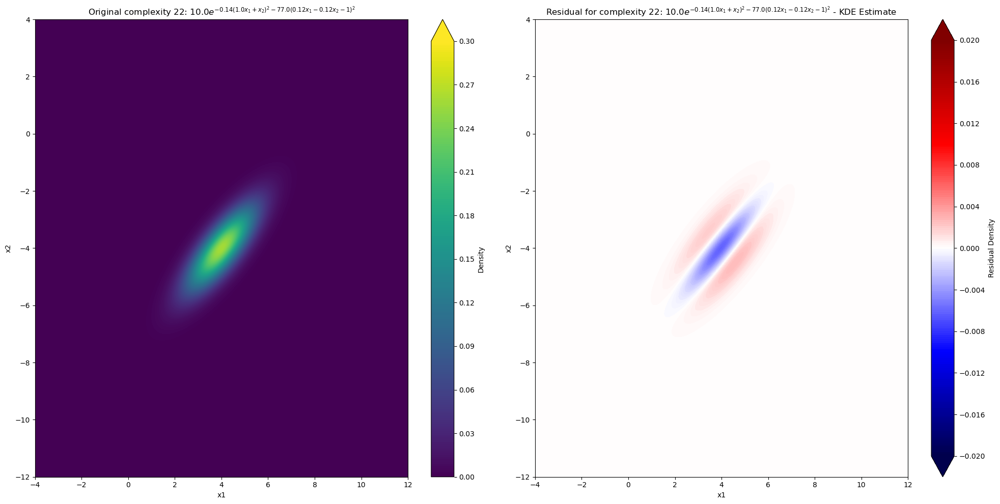

Complexity 22: Likelihood score: -58,298.44873718607
complexity 22 :: min predict: 0.00, max predict: 0.26
complexity 22 :: min residual: -0.01, max residual: 0.00
Complexity 22: MSE error: 2.832079e-04


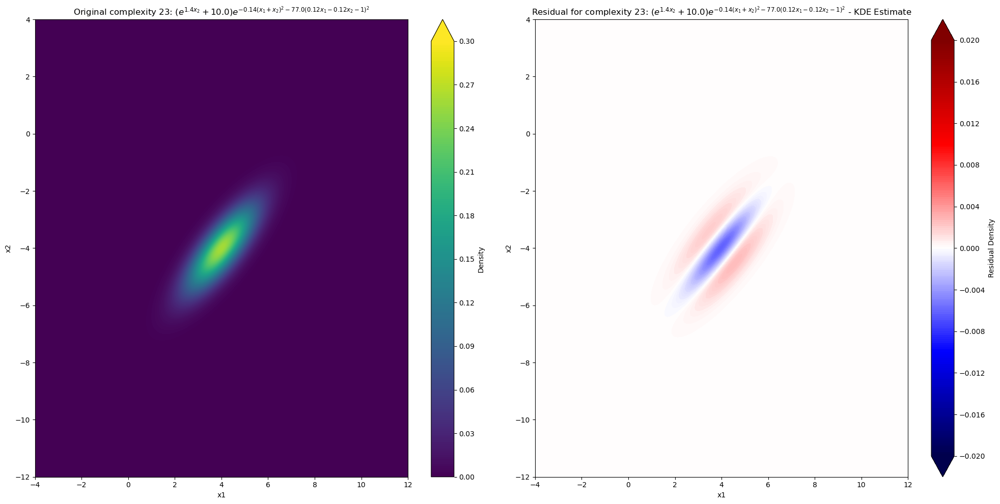

Complexity 23: Likelihood score: -58,297.654804140184
complexity 23 :: min predict: 0.00, max predict: 0.26
complexity 23 :: min residual: -0.01, max residual: 0.00
Complexity 23: MSE error: 2.878349e-04


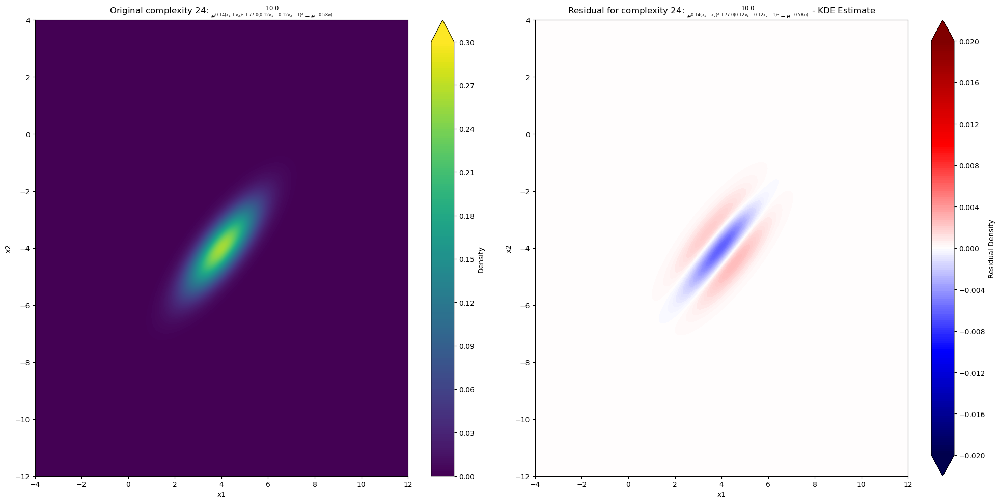

Complexity 24: Likelihood score: -58,324.61652371443
complexity 24 :: min predict: 0.00, max predict: 0.26
complexity 24 :: min residual: -0.01, max residual: 0.00
Complexity 24: MSE error: 2.971640e-04


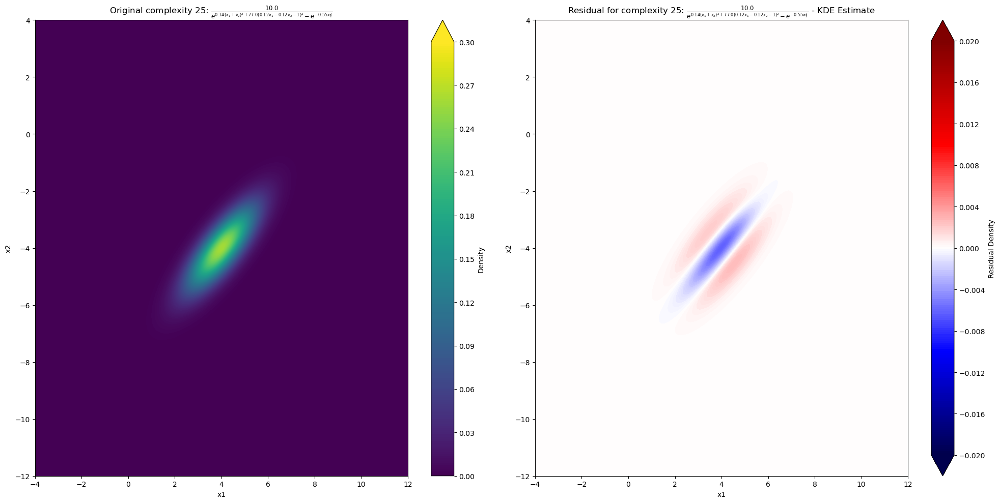

Complexity 25: Likelihood score: -58,319.8320581469
complexity 25 :: min predict: 0.00, max predict: 0.26
complexity 25 :: min residual: -0.01, max residual: 0.00
Complexity 25: MSE error: 2.944201e-04


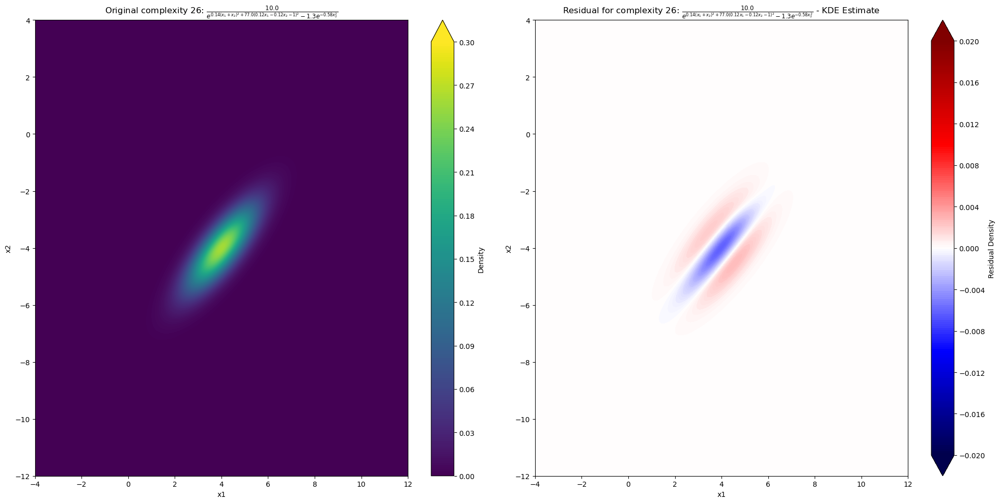

Complexity 26: Likelihood score: -58,314.98303645282
complexity 26 :: min predict: 0.00, max predict: 0.26
complexity 26 :: min residual: -0.01, max residual: 0.00
Complexity 26: MSE error: 2.938326e-04


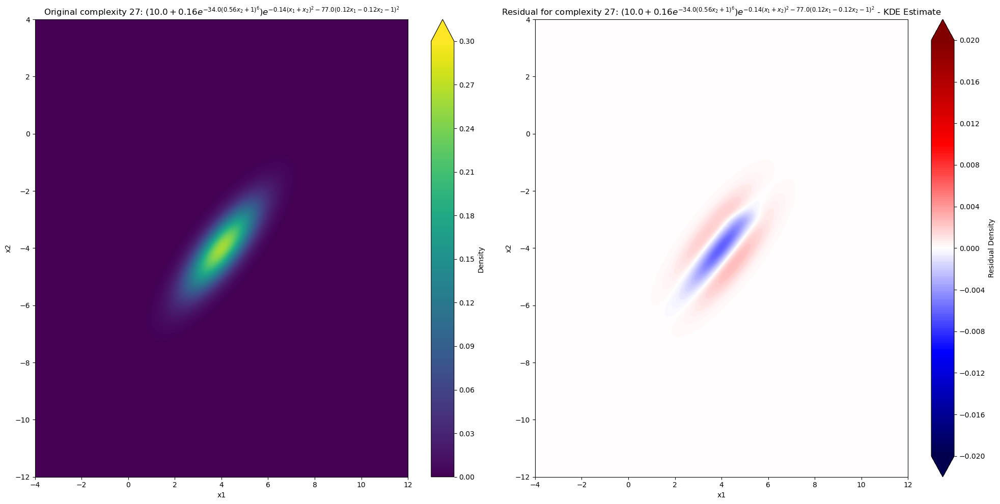

Complexity 27: Likelihood score: -58,277.75853238768
complexity 27 :: min predict: 0.00, max predict: 0.26
complexity 27 :: min residual: -0.01, max residual: 0.00
Complexity 27: MSE error: 2.958818e-04


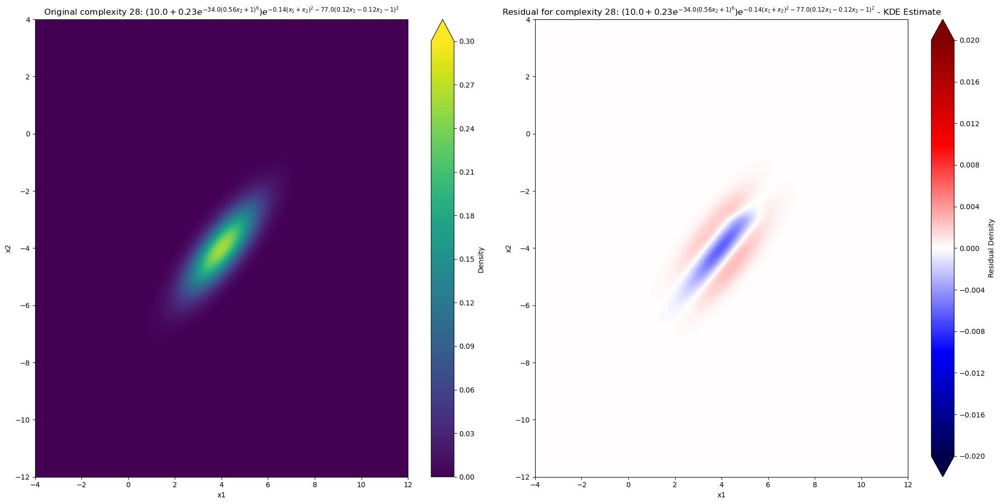

Complexity 28: Likelihood score: -58,288.75562840451
complexity 28 :: min predict: 0.00, max predict: 0.26
complexity 28 :: min residual: -0.01, max residual: 0.00
Complexity 28: MSE error: 3.061855e-04


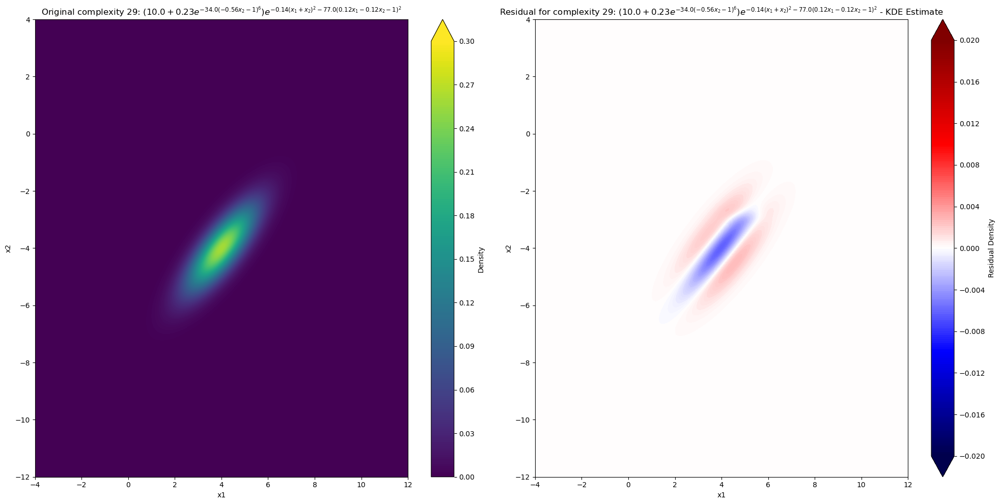

Complexity 29: Likelihood score: -58,287.852997632894
complexity 29 :: min predict: 0.00, max predict: 0.26
complexity 29 :: min residual: -0.01, max residual: 0.00
Complexity 29: MSE error: 3.060774e-04


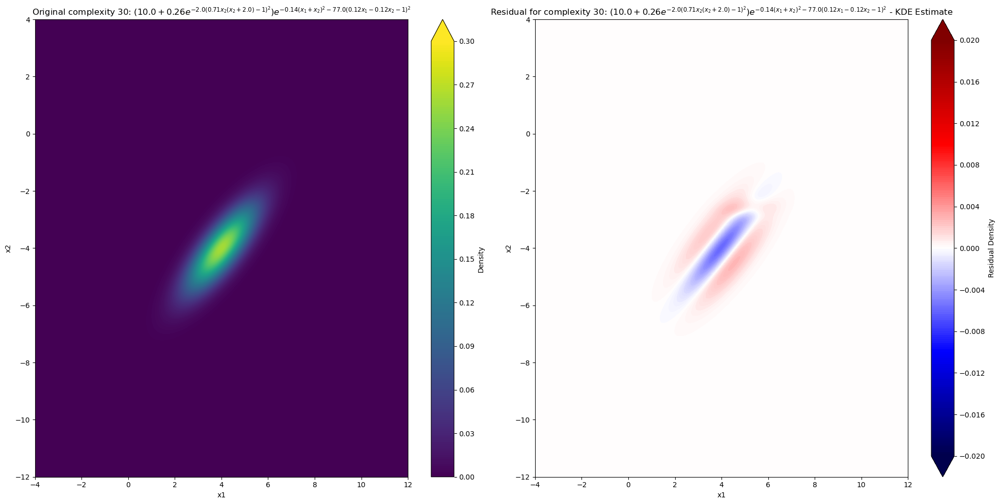

Complexity 30: Likelihood score: -58,258.61000182704
complexity 30 :: min predict: 0.00, max predict: 0.26
complexity 30 :: min residual: -0.01, max residual: 0.00
Complexity 30: MSE error: 2.775143e-04


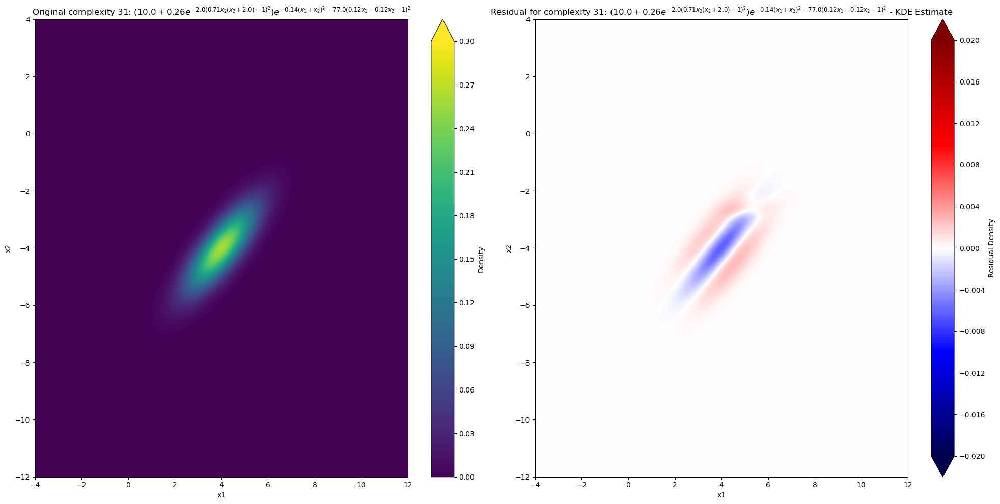

Complexity 31: Likelihood score: -58,300.96267340006
complexity 31 :: min predict: 0.00, max predict: 0.26
complexity 31 :: min residual: -0.01, max residual: 0.00
Complexity 31: MSE error: 3.064131e-04


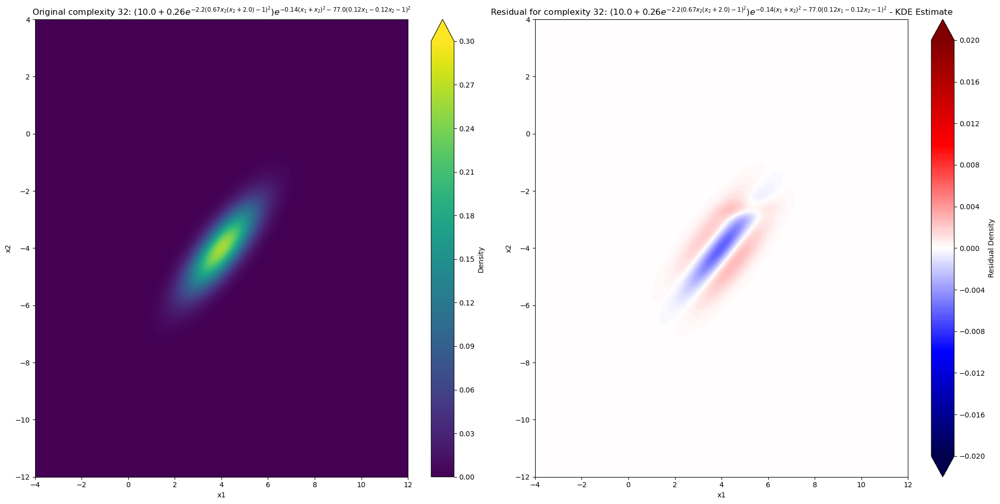

Complexity 32: Likelihood score: -58,300.129239860646
complexity 32 :: min predict: 0.00, max predict: 0.26
complexity 32 :: min residual: -0.01, max residual: 0.00
Complexity 32: MSE error: 3.061494e-04


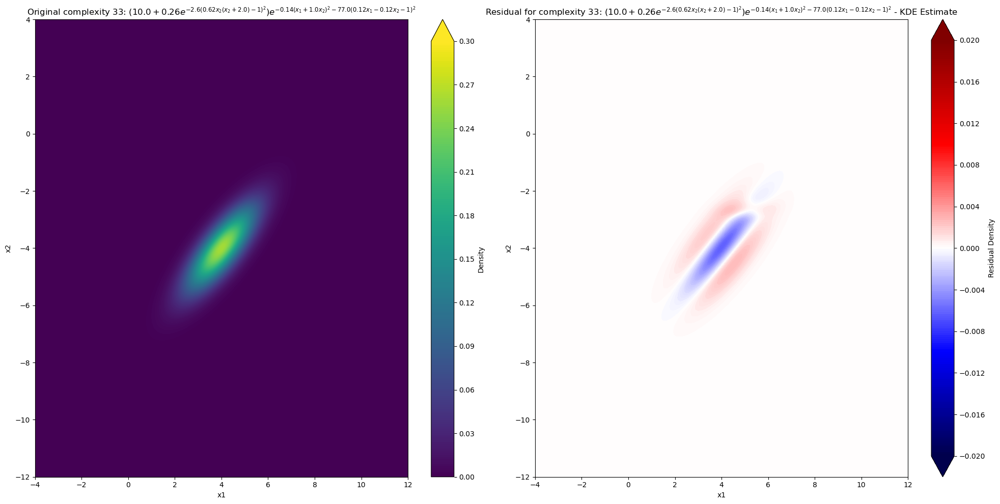

Complexity 33: Likelihood score: -58,292.72392646453
complexity 33 :: min predict: 0.00, max predict: 0.26
complexity 33 :: min residual: -0.01, max residual: 0.00
Complexity 33: MSE error: 3.023727e-04


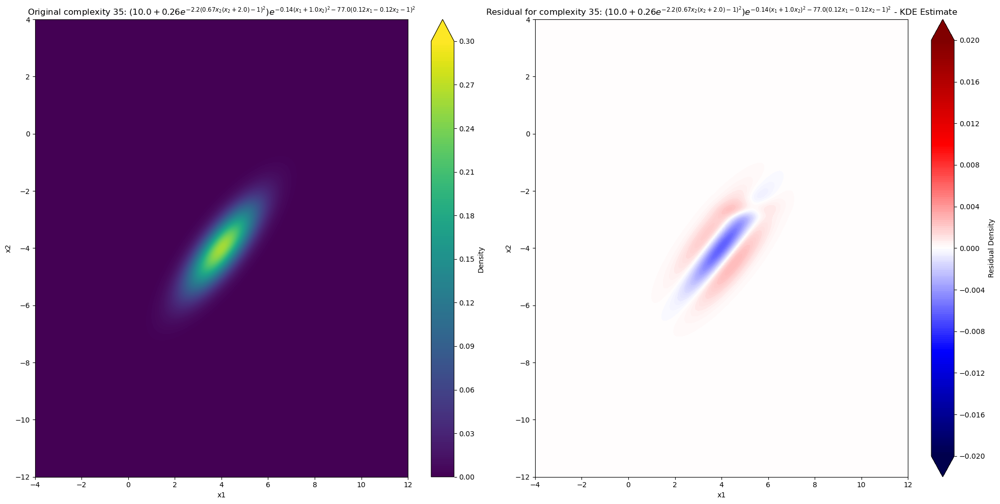

Complexity 35: Likelihood score: -58,294.01621884171
complexity 35 :: min predict: 0.00, max predict: 0.26
complexity 35 :: min residual: -0.01, max residual: 0.00
Complexity 35: MSE error: 3.028777e-04


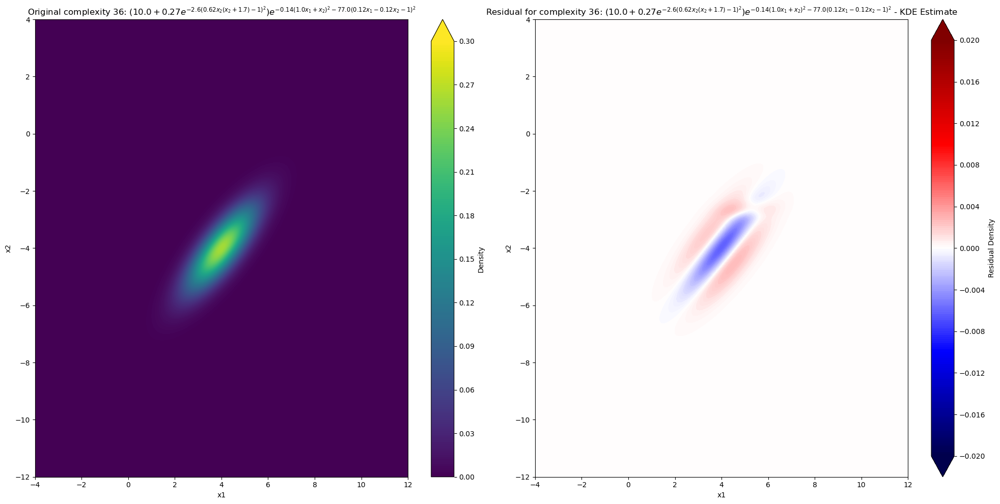

Complexity 36: Likelihood score: -58,304.63826372396
complexity 36 :: min predict: 0.00, max predict: 0.26
complexity 36 :: min residual: -0.01, max residual: 0.00
Complexity 36: MSE error: 3.058957e-04


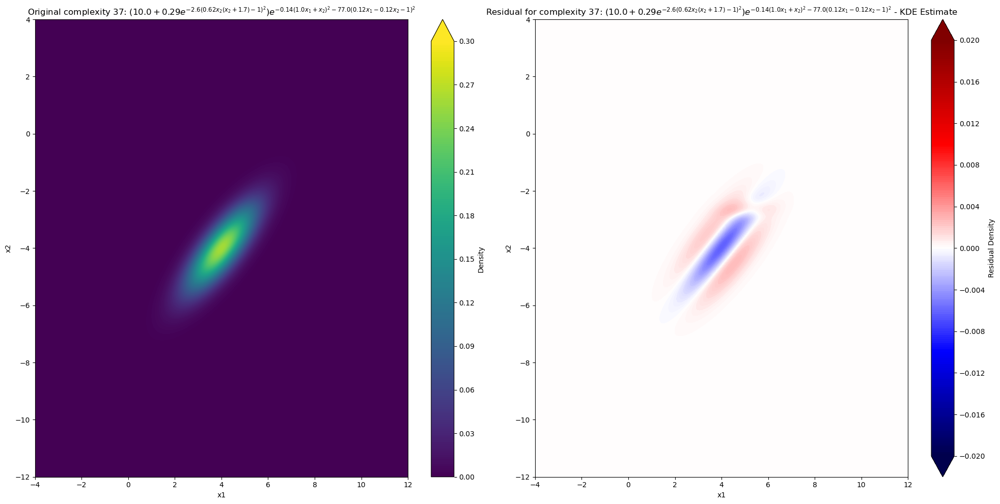

Complexity 37: Likelihood score: -58,300.97911401013
complexity 37 :: min predict: 0.00, max predict: 0.26
complexity 37 :: min residual: -0.01, max residual: 0.00
Complexity 37: MSE error: 3.067251e-04


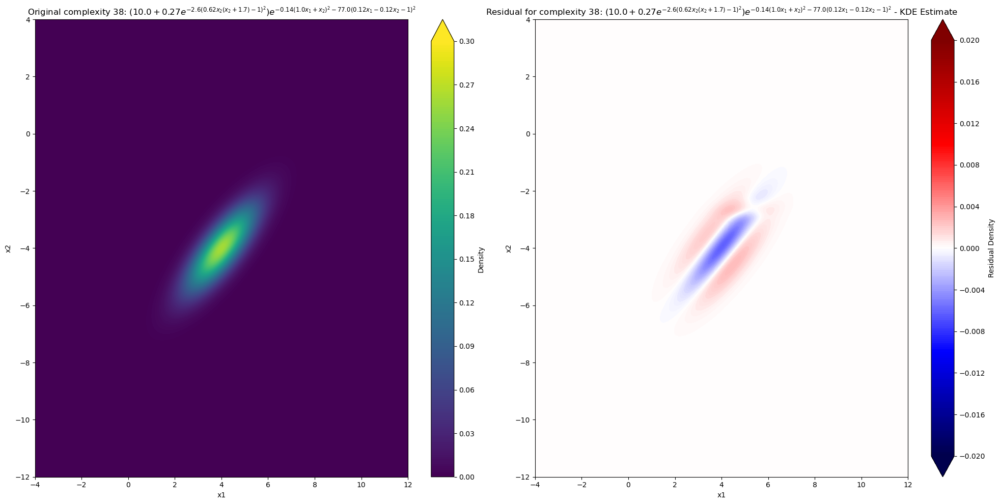

Complexity 38: Likelihood score: -58,311.39250971801
complexity 38 :: min predict: 0.00, max predict: 0.26
complexity 38 :: min residual: -0.01, max residual: 0.00
Complexity 38: MSE error: 3.067184e-04


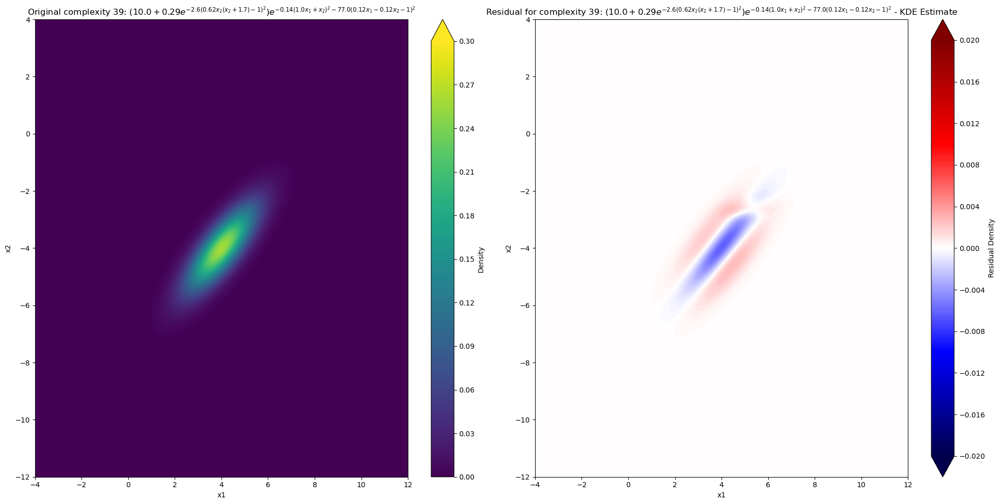

Complexity 39: Likelihood score: -58,307.73336000418
complexity 39 :: min predict: 0.00, max predict: 0.26
complexity 39 :: min residual: -0.01, max residual: 0.00
Complexity 39: MSE error: 3.073238e-04
Finished generating and saving plots for 33 functions.


In [65]:
# Iterate over the masked_functions list
for i, current_function in enumerate(predicted_functions):
    # Skip if the function is not defined or you only want to plot specific ones
    # if i not in [2, 5]:  # Example: plot only indices 2 and 5
    #     continue

    # Get the title for the current function
    title = latex_labels[i]

    # Create a new figure for each iteration
    fig, axes = plt.subplots(1, 2, figsize=(20, 10))
    
    # --- Plot 1: Original Function Plot (current_function) ---
    ax1 = axes[0]
    
    # Calculate the function output
    function_output = current_function(grids[0], grids[1])
    if np.shape(function_output) != np.shape(grids[0]):
        function_output = function_output*np.ones(grids[0].shape)

    # Set levels based on your required range
    levels_original = np.linspace(level_min, level_max, 200)
    
    contour1 = ax1.contourf(
        grids[0], grids[1],
        function_output/density_scale_factor,
        levels=levels_original,
        cmap='viridis',
        extend='max'
    )
    # The colorbar needs to be updated for each plot
    fig.colorbar(contour1, ax=ax1, label="Density", ticks=np.linspace(level_min, level_max, 11))
    
    ax1.set_xlabel(r"x1")
    ax1.set_ylabel(r"x2")
    ax1.set_title(f"Original complexity {complexity[i]}: {title}")
    # ax1.set_xlim(-0.1, 0.2)
    # ax1.set_ylim(-0.1, 0.2)

    # --- Plot 2: Residual Plot (current_function - sum_grid) ---
    ax2 = axes[1]
    
    # Calculate the residual
    residual_output = function_output/density_scale_factor - ground_truth_density
    
    # Set levels for the residual plot (should be symmetric around zero)
    levels_residual = np.linspace(level_min_delta, level_max_delta, 200)
    
    contour2 = ax2.contourf(
        grids[0], grids[1],
        residual_output,
        levels=levels_residual,
        cmap='seismic', # 'seismic' is good for residuals (zero in the middle)
        extend='both'
    )
    # The colorbar needs to be updated for each plot
    fig.colorbar(contour2, ax=ax2, label="Residual Density", ticks=np.linspace(level_min_delta, level_max_delta, 11))
    
    ax2.set_xlabel(r"x1")
    ax2.set_ylabel(r"x2")
    ax2.set_title(f"Residual for complexity {complexity[i]}: {title} - KDE Estimate")
    # ax2.set_xlim(-0.1, 0.2)
    # ax2.set_ylim(-0.1, 0.2)

    # Final adjustments and saving
    plt.tight_layout()
    
    # *** KEY CHANGE: Display the plot inline ***
    plt.show()
    plt.close(fig) 
    gc.collect()
    
    prediction_eval_at_samples = current_function(test_samples[:,0], test_samples[:,1])
    likelihood_score_of_prediction = np.sum(np.log(prediction_eval_at_samples/density_scale_factor))
    print(f"Complexity {complexity[i]}: Likelihood score: {likelihood_score_of_prediction:,}")
    print(f"complexity {complexity[i]} :: min predict: {np.min(current_function(grids[0], grids[1])/density_scale_factor):.2f}, max predict: {np.max(current_function(grids[0], grids[1])/density_scale_factor):.2f}")
    min_residual = np.min(current_function(grids[0], grids[1])/density_scale_factor - ground_truth_density)
    max_residual = np.max(current_function(grids[0], grids[1])/density_scale_factor - ground_truth_density)
    print(f"complexity {complexity[i]} :: min residual: {min_residual:.2f}, max residual: {max_residual:.2f}")
    mse_error = np.mean((density_scale_factor*residual_output)**2)
    print(f"Complexity {complexity[i]}: MSE error: {mse_error:.6e}")


# Note: plt.show() is typically outside the loop if you want to see all plots
# or not used at all if you are just saving the files.
print(f"Finished generating and saving plots for {len(predicted_functions)} functions.")

# Other Views (Miscellaneous)

## 3D Plot of KDE estimate

In [66]:
import plotly.graph_objects as go
import plotly.io as pio

fig = go.Figure(
    data=[go.Surface(z=kde_predicted_density, x=grids[0], y=grids[1], colorscale='Viridis')]
)

fig.update_layout(
    title=f"3D KDE PDF",
    scene=dict(
        xaxis=dict(title=r"x1", range=[-4, 12]),
        yaxis=dict(title=r"x2", range=[-12, 4]),
        zaxis_title="Density",
        aspectratio=dict(x=1, y=1, z=0.75)
    ),
    width=800,
    height=600,
)

# fig.show(renderer='browser')
pio.show(fig)

## Scatter plot of data input to SR pipeline

In [67]:
import numpy as np
import plotly.graph_objects as go
import plotly.io as pio

data_original = np.loadtxt('data/processed_data/gaussian_cluster_1_joint_data.csv', delimiter=',', skiprows=1)
indices = np.random.choice(data_original.shape[0], size=1000, replace=False)
data = data_original[indices]
fig = go.Figure(data=[go.Scatter3d(
    x=data[:, 0],
    y=data[:, 1],
    z=data[:, 2],
    mode='markers',
    marker=dict(
        size=1,
        color='red',
        opacity=0.8
    )
)])

# fig.show(renderer='browser')
pio.show(fig)

## Joint data in pipeline

In [68]:
import numpy as np
import plotly.graph_objects as go
import plotly.io as pio

data_in_pipeline = np.loadtxt('data/processed_data/gaussian_cluster_1_joint_data_in_pipeline.csv', delimiter=',', skiprows=1)
indices = np.random.choice(data_in_pipeline.shape[0], size=1000, replace=False)
data = data_in_pipeline[indices]
fig = go.Figure(data=[go.Scatter3d(
    x=data[:, 0],
    y=data[:, 1],
    z=data[:, 2],
    mode='markers',
    marker=dict(
        size=1,
        color='red',
        opacity=0.8
    )
)])

# fig.show(renderer='browser')
pio.show(fig)

## Plotting Surface from data

In [69]:
j_file_path = f'./data/processed_data/gaussian_cluster_1_joint_data.csv'
j_df = pd.read_csv(j_file_path, header=None)
j_samples = j_df.to_numpy()

x = j_samples[:, 0]
y = j_samples[:, 1]
z = j_samples[:, 2]

points = np.concatenate((x.reshape(-1,1), y.reshape(-1,1)), axis=1)

In [70]:
from scipy.interpolate import griddata
import plotly.graph_objects as go
import plotly.io as pio

# Create grid to interpolate onto
grid_res = 100  # Adjust as needed for quality/performance
xi = np.linspace(x.min(), x.max(), grid_res)
yi = np.linspace(y.min(), y.max(), grid_res)
X, Y = np.meshgrid(xi, yi)

# Interpolate z-values on the grid
Z = griddata((x, y), z, (X, Y), method='cubic')  # try 'linear' or 'nearest' if 'cubic' fails

# Plot using go.Surface
fig = go.Figure(
    data=[go.Surface(z=Z, x=xi, y=yi, colorscale='Viridis')]
)

fig.update_layout(
    title="3D PDF from scattered data",
    scene=dict(
        xaxis_title=r"$m_{12}^2$",
        yaxis_title=r"$m_{23}^2$",
        zaxis_title="Density"
    ),
    width=800,
    height=600,
)

# fig.show(renderer='browser')
pio.show(fig)